# Tarefa: 06 de junho



## 🎯 Apresentação dos modelos

O modelo determinístico apresentado abaixo:

$$
\begin{aligned}
    \frac{dx}{dt} &= x - x^3 + \frac{\lambda}{\varepsilon} y_2, \\
    \frac{dy_1}{dt} &= \frac{10}{\varepsilon^2} (y_2 - y_1), \\
    \frac{dy_2}{dt} &= \frac{1}{\varepsilon^2} (28 y_1 - y_2 - y_1 y_3), \\
    \frac{dy_3}{dt} &= \frac{1}{\varepsilon^2} \left( y_1 y_2 - \frac{8}{3} y_3 \right).
\end{aligned}
$$

O modelo estocástico é dado por:
$$
    \frac{dX}{dt} = X - X^3 + \sigma \frac{dW}{dt}
$$

Onde:

$$
    \sigma^2 = 2\lambda^2 \int_0^\infty \frac{1}{T} \left( \lim_{T \to \infty} \int_0^T \psi^s(y) \psi^{t+s}(y) \, ds \right) dt.
$$


## Gráficos

In [31]:
using DifferentialEquations, Plots

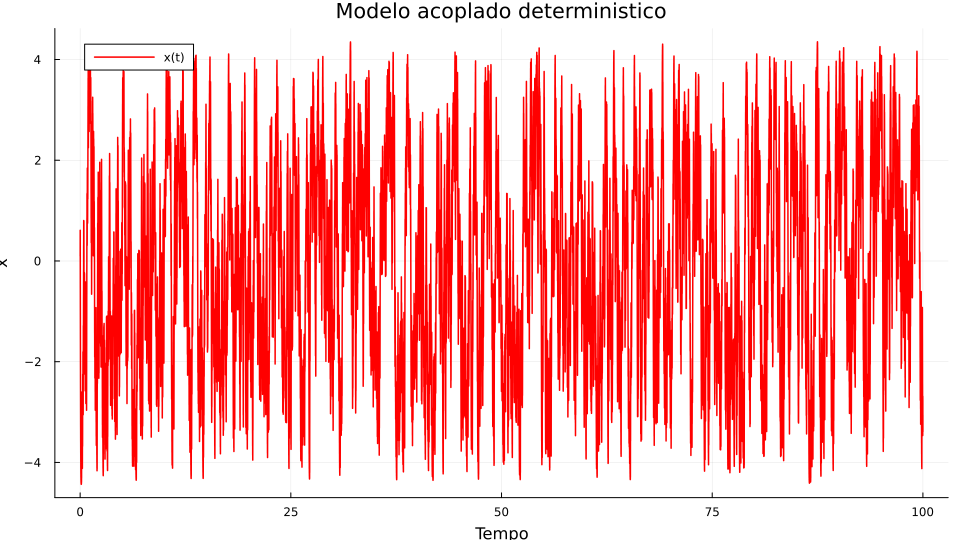

In [32]:
# Sistema original

function f(du, u, p, t)
    lambda = 1.0
    epsilon = 0.1

    x, y1, y2, y3 = u

    du[1] = x - x^3 + (lambda/epsilon) * y2
    du[2] = (10 / epsilon^2) * (y2 - y1)
    du[3] = (1 / epsilon^2) * (28*y1 - y2 - y1*y3)  
    du[4] = (1 / epsilon^2) * (y1*y2 - (8/3)*y3)
end

u0 = [0.1, 0.01, 0.01, 0.01]
tspan = (0.0, 100.0)
prob = ODEProblem(f, u0, tspan)
solucao_deterministico = solve(prob, abstol=1e-8, reltol=1e-6, maxiters=1_000_000)


plot(solucao_deterministico.t, solucao_deterministico[1, :];
     label = "x(t)",
     xlabel = "Tempo",
     ylabel = "x",
     title = "Modelo acoplado deterministico",
     size = (960, 540),
     color = :red,
     linewidth = 1.5)



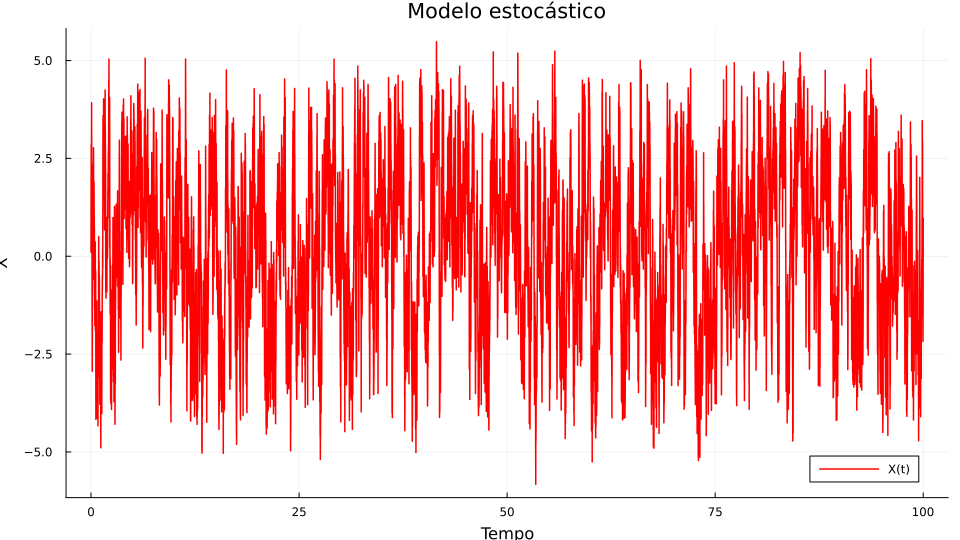

In [33]:
# Sistema estocástico
sigma = 8
x0 = 0.1
tspan = (0.0, 100.0)

f1(X, p, t) = X - X^3
f2(X, p, t) = sigma

W = WienerProcess(0.0, 0.0, 0.0)
prob = SDEProblem(f1, f2, x0, tspan, noise=W)
solucao_estocastico = solve(prob, SRIW1(), dt=0.01)

plot(solucao_estocastico.t, solucao_estocastico.u;
     label = "X(t)",
     xlabel = "Tempo",
     ylabel = "X",
     title = "Modelo estocástico",
     size = (960, 540),
     color = :red,
     linewidth = 1.5)
     

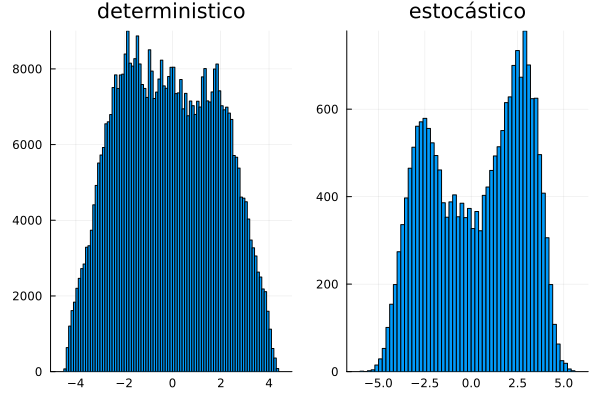

In [34]:
# Procurar o erro aqui
p1 = histogram(solucao_deterministico[1,: ], title="deterministico", bins=100)
p2 = histogram(solucao_estocastico.u, title="estocástico", bins=100)

plot(p1, p2, layout=(1, 2), legend=false)
plot(p1, p2, layout=(1, 2), legend=false)

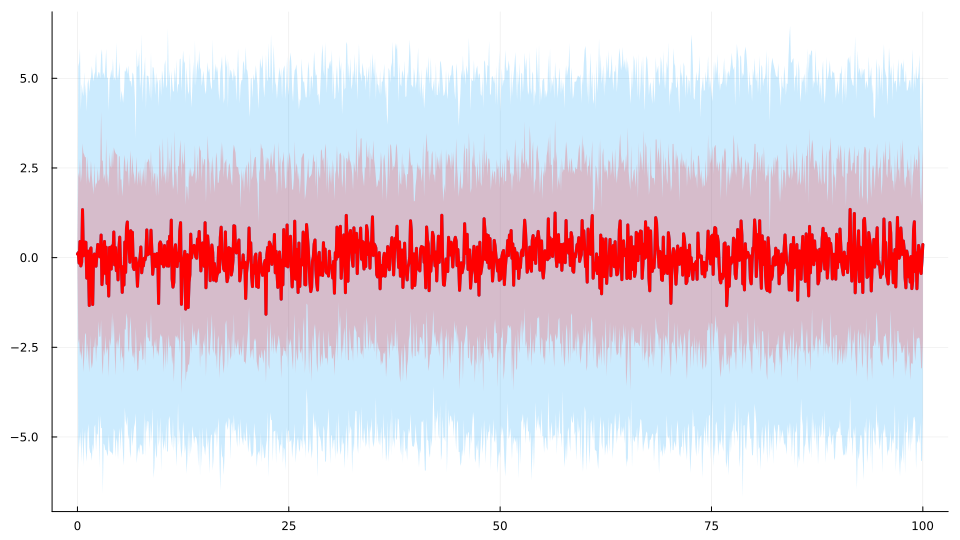

In [35]:
# Sistema estocástico (com ensemble)

sigma = 21.85
x0 = 0.1
tspan = (0.0, 100.0)

f1(X, p, t) = X - X^3
f2(X, p, t) = sigma

W = WienerProcess(0.0, 0.0, 0.0)
prob = SDEProblem(f1, f2, x0, tspan, noise=W)

prob_ensemble = EnsembleProblem(prob)
solucao_ensemble = solve(prob_ensemble, SRIW1(), dt=0.01, trajectories=100)

t = 0:0.1:100
s1 = EnsembleSummary(solucao_ensemble, t)  
s2 = EnsembleSummary(solucao_ensemble, t; quantiles = [0.25, 0.75]) 

plot(s1;
     legend = true,
     size = (960, 540))


plot!(s2;
    color = :red)
